<a href="https://colab.research.google.com/github/William-Metz/NXTPlaySampleNotebooks/blob/main/DetectPlayersAndLabelOffenseAndDefense.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Setup


## Installations

In [ ]:
!pip install ultralytics==8.0.134
!pip install roboflow --quiet
!pip install supervision


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 629.1/629.1 kB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.5/68.5 kB 2.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 10.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 38.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 9.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.5/77.5 kB 10.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 7.2 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
lida 0.0.10 requires fastapi, which is not installed.
lida 0.0.10 requires kaleido, which is not

## Imports

In [ ]:
from IPython import display
display.clear_output()
import ultralytics
ultralytics.checks()
from ultralytics import YOLO
from IPython.display import display, Image
import matplotlib.pyplot as plt
import cv2
import numpy as np
import supervision as sv
from ultralytics.yolo.v8 import detect
from supervision.detection.core import Detections
import pandas as pd
import os
HOME = os.getcwd()

Ultralytics YOLOv8.0.134 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (8 CPUs, 51.0 GB RAM, 27.2/166.8 GB disk)


## Mount Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Importing Model

In [ ]:
#This model was trained with imgsz =1000 and 100 epochs to segment images into offense and Defense
#You can see how this model was trained in FieldSegmentation.ipynb
modelSeg= YOLO("/content/drive/My Drive/MidtermProject/largeModel.pt")
modelSeg.task = "segment"


#This model is pretrained by YOLOv8 to be able to detect people
model =YOLO("yolov8n.pt")

# Using Model

## Photos
This is how to use a pretrained model on photos


0: 800x1600 1 defense, 1 offense, 92.2ms
Speed: 13.4ms preprocess, 92.2ms inference, 46.8ms postprocess per image at shape (1, 3, 800, 1600)


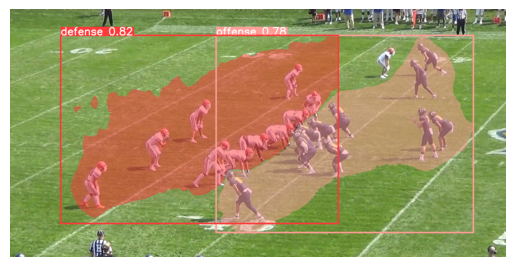

In [ ]:
image_path = "/content/drive/My Drive/MidtermProject/img2.jpg"
image = cv2.imread(image_path)

# Run YOLOv8 inference on the image
results = modelSeg(image)

# Visualize the results on the image
annotated_image = results[0].plot()

# Convert BGR to RGB (OpenCV loads images in BGR format)
annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)

# Display the annotated image using matplotlib
plt.imshow(annotated_image_rgb)
plt.axis('off')  # Hide the axes
plt.show()



YOLOv8 Person Detection Model

In [ ]:
results = model("/content/drive/My Drive/MidtermProject/photo154.png")

#Output of the model
print(results)

## Video
Here's into using the field segmentation on video


In [ ]:
#Some video to be analyzed by model
VIDEO_PATH = "/content/drive/My Drive/MidtermProject/test3.mp4"

#Out put front model
video_info = sv.VideoInfo.from_video_path(VIDEO_PATH)


image 1/1 /content/drive/My Drive/MidtermProject/photo154.png: 416x640 24 persons, 7.4ms
Speed: 2.3ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


[ultralytics.yolo.engine.results.Results object with attributes:

boxes: ultralytics.yolo.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut', 55: 'cake', 56: 'chair', 57: '

## Tracking Frame by Frame Accuracy
This was used to track how many players on offense and defense were detected in a given frame. Was useful when I had poor quality data

In [ ]:
correct = 0 #Tracks the number of frames that have 11 on offense and 11 on defense
halfcorrect =0 #Tracks the number of frames that have 11 on offense or 11 on defense
total = 0 #Tracks the total number of frames

## Video Anaylze algorithm

In [ ]:
from tensorflow.keras.models import load_model
import joblib

formationModel = load_model('/content/drive/My Drive/MidtermProject/formationModel.h5')
scaler = joblib.load('/content/drive/My Drive/MidtermProject/formationScaler.pkl')

df = pd.read_csv('/content/drive/My Drive/MidtermProject/simpleLabeledData.csv')

columns_to_keep = [f'offense_player{i}_x' for i in range(1, 12)] + \
                  [f'offense_player{i}_y' for i in range(1, 12)] +\
                  ['off_formation']
                 # [f'defense_player{i}_x' for i in range(1, 12)] + \
                  #[f'defense_player{i}_y' for i in range(1, 12)] + \



df = df[columns_to_keep]

# Replace 0.0 with numpy.nan
df = df.replace(0.0, np.nan)

# Drop rows with NaN in specific columns
#df = df.dropna(subset=['offense_player1_x', 'defense_player2_x', 'defense_player2_x', 'defense_player1_x'])
df = df.dropna(subset=['offense_player7_x'])
# Replace NaN back with 0.0 if necessary
df = df.fillna(0.0)

df.to_csv('updated_file.csv', index=False)

df = pd.get_dummies(df, columns=['off_formation'])
X = df.drop([col for col in df.columns if col.startswith('off_formation')], axis=1)
y = df[[col for col in df.columns if col.startswith('off_formation')]]

###Function determines if player inside mask

In [ ]:
def is_inside_area(detection, mask_object):
    # Assuming detection is a tuple (x1, y1, x2, y2, confidence, class_id, _)
    # Convert detection coordinates to integer for indexing
    x1, y1, x2, y2 = map(int, detection)
    mid_x = int( (x1 + x2) / 2)
    mid_y =int((y1 + y2) / 2)

 #   print(f"mipoint ({mid_x},{mid_y})")


    if isinstance(mask_object.masks.data, np.ndarray):
        mask_array = mask_object.masks.data
    else:
        mask_array = mask_object.masks.data.cpu().numpy()  # Convert the tensor to numpy if necessary
  #  print(f"mask array: {mask_array.shape}")
    #mask_array = mask_array.astype(bool)

    # Check if the midpoint is inside the mask
    # Note: The index [0] assumes you're only interested in the first mask
    # If you have multiple masks, you'll need to select the appropriate one based on your requirements

    is_inside = False
    if (0 <= mid_y < mask_array.shape[1]) and (0 <= mid_x < mask_array.shape[2]):
        is_inside = mask_array[0, mid_y, mid_x] > 0

    return is_inside


### For visualations

In [ ]:
def apply_colored_mask(frame, seg_results, seg_detections, alpha=0.5):
    for i in range(len(seg_results)):
        mask = seg_results[i].masks.data.cpu().numpy()
        single_mask = mask[0]

        # Threshold the mask if necessary (here, a simple conversion to boolean)
        boolean_mask = single_mask.astype(bool)
        boolean_mask = boolean_mask * 255

        # Resizing the mask to match the frame dimensions
        resized_mask = cv2.resize(boolean_mask, (frame.shape[1], frame.shape[0]), interpolation=cv2.INTER_NEAREST)

        # Ensure resized mask is binary (True or False)
        resized_mask = resized_mask > 128  # Adjust the threshold as needed

        # Blue and red colors in BGR format
        blue_color = np.array([0, 0, 255], dtype=np.uint8)
        red_color = np.array([255, 0, 0], dtype=np.uint8)

        if seg_detections[i].class_id == 1:
            # Apply blue color with transparency
            frame[resized_mask] = (frame[resized_mask].astype(np.float32) * (1 - alpha) + blue_color.astype(np.float32) * alpha).astype(np.uint8)
        else:
            # Apply red color with transparency
            frame[resized_mask] = (frame[resized_mask].astype(np.float32) * (1 - alpha) + red_color.astype(np.float32) * alpha).astype(np.uint8)

    return frame


### This proccesses each frame of the video


0: 928x1600 1 defense, 1 offense, 63.3ms
Speed: 8.8ms preprocess, 63.3ms inference, 2.6ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 94 persons, 1 horse, 10 sports balls, 2 baseball gloves, 20.8ms
Speed: 9.4ms preprocess, 20.8ms inference, 1.4ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
height_scale: 1.0288248337028825
width_scale: 1.011378002528445



0: 928x1600 1 defense, 1 offense, 63.0ms
Speed: 9.7ms preprocess, 63.0ms inference, 2.4ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 94 persons, 1 horse, 10 sports balls, 2 baseball gloves, 17.6ms
Speed: 9.2ms preprocess, 17.6ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


defense: 12
offense: 9
unknown: 0
torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 12
offense: 9
(11, 2)


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


1/1 [==============================] - 1s 741ms/step



0: 928x1600 1 defense, 1 offense, 52.5ms
Speed: 11.6ms preprocess, 52.5ms inference, 2.6ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 94 persons, 1 horse, 10 sports balls, 2 baseball gloves, 17.6ms
Speed: 9.8ms preprocess, 17.6ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
height_scale: 1.0288248337028825
width_scale: 1.011378002528445



0: 928x1600 1 defense, 1 offense, 45.2ms
Speed: 9.6ms preprocess, 45.2ms inference, 2.4ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 94 persons, 1 horse, 10 sports balls, 2 baseball gloves, 15.4ms
Speed: 9.6ms preprocess, 15.4ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


defense: 12
offense: 8
unknown: 0
torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 12
offense: 8
(11, 2)
1/1 [==============================] - 0s 18ms/step


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(

0: 928x1600 1 defense, 1 offense, 44.7ms
Speed: 9.6ms preprocess, 44.7ms inference, 2.4ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 93 persons, 1 horse, 10 sports balls, 2 baseball gloves, 15.2ms
Speed: 10.0ms preprocess, 15.2ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
height_scale: 1.0288248337028825
width_scale: 1.011378002528445



0: 928x1600 1 defense, 1 offense, 44.1ms
Speed: 9.8ms preprocess, 44.1ms inference, 2.4ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 93 persons, 1 horse, 10 sports balls, 2 baseball gloves, 15.1ms
Speed: 9.8ms preprocess, 15.1ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


defense: 12
offense: 8
unknown: 0
torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 12
offense: 8
(11, 2)
1/1 [==============================] - 0s 19ms/step


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(

0: 928x1600 1 defense, 1 offense, 39.4ms
Speed: 9.7ms preprocess, 39.4ms inference, 4.0ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 93 persons, 10 sports balls, 2 baseball gloves, 13.6ms
Speed: 10.1ms preprocess, 13.6ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
height_scale: 1.0288248337028825
width_scale: 1.011378002528445



0: 928x1600 1 defense, 1 offense, 39.2ms
Speed: 8.8ms preprocess, 39.2ms inference, 2.5ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 93 persons, 10 sports balls, 2 baseball gloves, 13.5ms
Speed: 9.8ms preprocess, 13.5ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


defense: 12
offense: 8
unknown: 0
torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 12
offense: 8
(11, 2)
1/1 [==============================] - 0s 19ms/step


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(

0: 928x1600 1 defense, 1 offense, 36.5ms
Speed: 9.1ms preprocess, 36.5ms inference, 2.2ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 94 persons, 10 sports balls, 2 baseball gloves, 12.7ms
Speed: 8.6ms preprocess, 12.7ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
height_scale: 1.0288248337028825
width_scale: 1.011378002528445



0: 928x1600 1 defense, 1 offense, 36.7ms
Speed: 8.6ms preprocess, 36.7ms inference, 2.4ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 94 persons, 10 sports balls, 2 baseball gloves, 13.5ms
Speed: 9.6ms preprocess, 13.5ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


defense: 12
offense: 8
unknown: 0
torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 12
offense: 8
(11, 2)
1/1 [==============================] - 0s 19ms/step


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(

0: 928x1600 1 defense, 1 offense, 35.1ms
Speed: 9.0ms preprocess, 35.1ms inference, 2.4ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 95 persons, 1 horse, 10 sports balls, 2 baseball gloves, 12.9ms
Speed: 9.0ms preprocess, 12.9ms inference, 1.4ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
height_scale: 1.0288248337028825
width_scale: 1.011378002528445



0: 928x1600 1 defense, 1 offense, 35.3ms
Speed: 10.1ms preprocess, 35.3ms inference, 2.4ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 95 persons, 1 horse, 10 sports balls, 2 baseball gloves, 12.3ms
Speed: 10.0ms preprocess, 12.3ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


defense: 12
offense: 9
unknown: 0
torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 12
offense: 9
(11, 2)
1/1 [==============================] - 0s 19ms/step


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(

0: 928x1600 1 defense, 1 offense, 34.9ms
Speed: 9.3ms preprocess, 34.9ms inference, 2.7ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 94 persons, 10 sports balls, 2 baseball gloves, 12.1ms
Speed: 9.6ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
height_scale: 1.0288248337028825
width_scale: 1.011378002528445



0: 928x1600 1 defense, 1 offense, 34.7ms
Speed: 8.5ms preprocess, 34.7ms inference, 2.2ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 94 persons, 10 sports balls, 2 baseball gloves, 12.2ms
Speed: 8.6ms preprocess, 12.2ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


defense: 12
offense: 8
unknown: 0
torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 12
offense: 8
(11, 2)
1/1 [==============================] - 0s 19ms/step


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(

0: 928x1600 1 defense, 1 offense, 33.7ms
Speed: 9.1ms preprocess, 33.7ms inference, 2.4ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 94 persons, 10 sports balls, 2 baseball gloves, 12.6ms
Speed: 8.8ms preprocess, 12.6ms inference, 1.4ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
height_scale: 1.0288248337028825
width_scale: 1.011378002528445



0: 928x1600 1 defense, 1 offense, 33.6ms
Speed: 10.5ms preprocess, 33.6ms inference, 2.3ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 94 persons, 10 sports balls, 2 baseball gloves, 12.5ms
Speed: 9.1ms preprocess, 12.5ms inference, 1.4ms postprocess per image at shape (1, 3, 928, 1600)


defense: 12
offense: 8
unknown: 0
torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 12
offense: 8
(11, 2)
1/1 [==============================] - 0s 18ms/step


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(

0: 928x1600 1 defense, 1 offense, 32.8ms
Speed: 8.9ms preprocess, 32.8ms inference, 2.2ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 94 persons, 10 sports balls, 2 baseball gloves, 12.5ms
Speed: 9.0ms preprocess, 12.5ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
height_scale: 1.0288248337028825
width_scale: 1.011378002528445



0: 928x1600 1 defense, 1 offense, 32.8ms
Speed: 9.4ms preprocess, 32.8ms inference, 2.2ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 94 persons, 10 sports balls, 2 baseball gloves, 12.1ms
Speed: 8.8ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 928, 1600)


defense: 12
offense: 8
unknown: 0
torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 12
offense: 8
(11, 2)
1/1 [==============================] - 0s 20ms/step


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(

0: 928x1600 1 defense, 1 offense, 31.7ms
Speed: 9.5ms preprocess, 31.7ms inference, 2.5ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 94 persons, 10 sports balls, 2 baseball gloves, 12.3ms
Speed: 8.4ms preprocess, 12.3ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
height_scale: 1.0288248337028825
width_scale: 1.011378002528445



0: 928x1600 1 defense, 1 offense, 32.1ms
Speed: 9.3ms preprocess, 32.1ms inference, 2.3ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 94 persons, 10 sports balls, 2 baseball gloves, 12.6ms
Speed: 9.7ms preprocess, 12.6ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


defense: 12
offense: 8
unknown: 0
torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 12
offense: 8
(11, 2)
1/1 [==============================] - 0s 18ms/step


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(

0: 928x1600 1 defense, 1 offense, 32.2ms
Speed: 9.3ms preprocess, 32.2ms inference, 2.2ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 94 persons, 10 sports balls, 2 baseball gloves, 12.1ms
Speed: 9.2ms preprocess, 12.1ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
height_scale: 1.0288248337028825
width_scale: 1.011378002528445



0: 928x1600 1 defense, 1 offense, 32.5ms
Speed: 9.5ms preprocess, 32.5ms inference, 2.2ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 94 persons, 10 sports balls, 2 baseball gloves, 12.0ms
Speed: 9.0ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


defense: 12
offense: 8
unknown: 0
torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 12
offense: 8
(11, 2)
1/1 [==============================] - 0s 19ms/step


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(

0: 928x1600 1 defense, 1 offense, 32.8ms
Speed: 9.1ms preprocess, 32.8ms inference, 2.4ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 94 persons, 10 sports balls, 2 baseball gloves, 12.9ms
Speed: 9.2ms preprocess, 12.9ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
height_scale: 1.0288248337028825
width_scale: 1.011378002528445



0: 928x1600 1 defense, 1 offense, 33.0ms
Speed: 8.9ms preprocess, 33.0ms inference, 2.2ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 94 persons, 10 sports balls, 2 baseball gloves, 12.0ms
Speed: 9.0ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


defense: 12
offense: 8
unknown: 0
torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 12
offense: 8
(11, 2)
1/1 [==============================] - 0s 19ms/step


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(

0: 928x1600 1 defense, 1 offense, 31.7ms
Speed: 8.7ms preprocess, 31.7ms inference, 3.1ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 94 persons, 10 sports balls, 2 baseball gloves, 12.2ms
Speed: 8.6ms preprocess, 12.2ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
height_scale: 1.0288248337028825
width_scale: 1.011378002528445



0: 928x1600 1 defense, 1 offense, 31.7ms
Speed: 9.1ms preprocess, 31.7ms inference, 2.3ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 94 persons, 10 sports balls, 2 baseball gloves, 12.1ms
Speed: 9.4ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 928, 1600)


defense: 12
offense: 8
unknown: 0
torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 12
offense: 8
(11, 2)
1/1 [==============================] - 0s 19ms/step


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(

0: 928x1600 1 defense, 1 offense, 32.5ms
Speed: 9.0ms preprocess, 32.5ms inference, 2.4ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 94 persons, 10 sports balls, 2 baseball gloves, 12.0ms
Speed: 9.2ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
height_scale: 1.0288248337028825
width_scale: 1.011378002528445



0: 928x1600 1 defense, 1 offense, 31.7ms
Speed: 8.9ms preprocess, 31.7ms inference, 2.4ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 94 persons, 10 sports balls, 2 baseball gloves, 12.3ms
Speed: 9.1ms preprocess, 12.3ms inference, 1.4ms postprocess per image at shape (1, 3, 928, 1600)


defense: 12
offense: 8
unknown: 0
torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 12
offense: 8
(11, 2)
1/1 [==============================] - 0s 19ms/step


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(

0: 928x1600 1 defense, 1 offense, 31.8ms
Speed: 9.4ms preprocess, 31.8ms inference, 2.3ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 94 persons, 10 sports balls, 2 baseball gloves, 11.3ms
Speed: 9.3ms preprocess, 11.3ms inference, 1.8ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
height_scale: 1.0288248337028825
width_scale: 1.011378002528445



0: 928x1600 1 defense, 1 offense, 31.9ms
Speed: 10.2ms preprocess, 31.9ms inference, 2.3ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 94 persons, 10 sports balls, 2 baseball gloves, 12.1ms
Speed: 9.6ms preprocess, 12.1ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


defense: 12
offense: 8
unknown: 0
torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 12
offense: 8
(11, 2)
1/1 [==============================] - 0s 19ms/step


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(

0: 928x1600 1 defense, 1 offense, 32.6ms
Speed: 9.7ms preprocess, 32.6ms inference, 2.6ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 94 persons, 10 sports balls, 2 baseball gloves, 12.8ms
Speed: 10.0ms preprocess, 12.8ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
height_scale: 1.0288248337028825
width_scale: 1.011378002528445



0: 928x1600 1 defense, 1 offense, 32.9ms
Speed: 9.6ms preprocess, 32.9ms inference, 2.5ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 94 persons, 10 sports balls, 2 baseball gloves, 12.1ms
Speed: 9.3ms preprocess, 12.1ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


defense: 12
offense: 8
unknown: 0
torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 12
offense: 8
(11, 2)
1/1 [==============================] - 0s 20ms/step


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(

0: 928x1600 1 defense, 1 offense, 33.2ms
Speed: 9.9ms preprocess, 33.2ms inference, 2.4ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 94 persons, 10 sports balls, 2 baseball gloves, 12.7ms
Speed: 10.0ms preprocess, 12.7ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
height_scale: 1.0288248337028825
width_scale: 1.011378002528445



0: 928x1600 1 defense, 1 offense, 33.1ms
Speed: 9.2ms preprocess, 33.1ms inference, 2.2ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 94 persons, 10 sports balls, 2 baseball gloves, 12.1ms
Speed: 9.2ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 928, 1600)


defense: 12
offense: 8
unknown: 0
torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 12
offense: 8
(11, 2)
1/1 [==============================] - 0s 18ms/step


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(

0: 928x1600 1 defense, 1 offense, 32.7ms
Speed: 9.6ms preprocess, 32.7ms inference, 2.9ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 94 persons, 10 sports balls, 2 baseball gloves, 12.2ms
Speed: 9.4ms preprocess, 12.2ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
height_scale: 1.0288248337028825
width_scale: 1.011378002528445



0: 928x1600 1 defense, 1 offense, 32.4ms
Speed: 9.5ms preprocess, 32.4ms inference, 3.0ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 94 persons, 10 sports balls, 2 baseball gloves, 12.1ms
Speed: 9.6ms preprocess, 12.1ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


defense: 12
offense: 8
unknown: 0
torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 12
offense: 8
(11, 2)
1/1 [==============================] - 0s 19ms/step


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(

0: 928x1600 1 defense, 1 offense, 32.9ms
Speed: 9.7ms preprocess, 32.9ms inference, 2.4ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 94 persons, 10 sports balls, 2 baseball gloves, 12.6ms
Speed: 12.3ms preprocess, 12.6ms inference, 1.9ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
height_scale: 1.0288248337028825
width_scale: 1.011378002528445



0: 928x1600 1 defense, 1 offense, 33.0ms
Speed: 9.3ms preprocess, 33.0ms inference, 2.4ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 94 persons, 10 sports balls, 2 baseball gloves, 12.7ms
Speed: 9.5ms preprocess, 12.7ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


defense: 12
offense: 8
unknown: 0
torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 12
offense: 8
(11, 2)
1/1 [==============================] - 0s 20ms/step


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(

0: 928x1600 1 defense, 1 offense, 32.4ms
Speed: 8.6ms preprocess, 32.4ms inference, 2.3ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 94 persons, 10 sports balls, 2 baseball gloves, 12.5ms
Speed: 8.3ms preprocess, 12.5ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
height_scale: 1.0288248337028825
width_scale: 1.011378002528445



0: 928x1600 1 defense, 1 offense, 32.5ms
Speed: 9.7ms preprocess, 32.5ms inference, 2.7ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 94 persons, 10 sports balls, 2 baseball gloves, 12.3ms
Speed: 10.0ms preprocess, 12.3ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


defense: 12
offense: 8
unknown: 0
torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 12
offense: 8
(11, 2)
1/1 [==============================] - 0s 23ms/step


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(

0: 928x1600 1 defense, 1 offense, 33.0ms
Speed: 9.4ms preprocess, 33.0ms inference, 2.4ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 94 persons, 10 sports balls, 2 baseball gloves, 12.1ms
Speed: 9.8ms preprocess, 12.1ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
height_scale: 1.0288248337028825
width_scale: 1.011378002528445



0: 928x1600 1 defense, 1 offense, 34.8ms
Speed: 10.0ms preprocess, 34.8ms inference, 2.5ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 94 persons, 10 sports balls, 2 baseball gloves, 12.7ms
Speed: 8.9ms preprocess, 12.7ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


defense: 12
offense: 8
unknown: 0
torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 12
offense: 8
(11, 2)
1/1 [==============================] - 0s 20ms/step


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
<ipython-input-17-b92b581f1b58>:119: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10, 10))

0: 928x1600 1 defense, 1 offense, 34.0ms
Speed: 9.9ms preprocess, 34.0ms inference, 2.3ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 94 persons, 10 sports balls, 2 baseball gloves, 12.5ms
Speed: 8.9ms preprocess, 12.5ms inference, 1.7ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
height_scale: 1.0288248337028825
width_scale: 1.011378002528445



0: 928x1600 1 defense, 1 offense, 34.0ms
Speed: 9.0ms preprocess, 34.0ms inference, 2.4ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 94 persons, 10 sports balls, 2 baseball gloves, 12.5ms
Speed: 8.9ms preprocess, 12.5ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


defense: 12
offense: 8
unknown: 0
torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 12
offense: 8
(11, 2)
1/1 [==============================] - 0s 20ms/step


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(

0: 928x1600 1 defense, 1 offense, 33.6ms
Speed: 9.7ms preprocess, 33.6ms inference, 2.2ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 94 persons, 10 sports balls, 2 baseball gloves, 12.1ms
Speed: 9.0ms preprocess, 12.1ms inference, 1.7ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
height_scale: 1.0288248337028825
width_scale: 1.011378002528445



0: 928x1600 1 defense, 1 offense, 33.7ms
Speed: 9.0ms preprocess, 33.7ms inference, 2.3ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 94 persons, 10 sports balls, 2 baseball gloves, 12.2ms
Speed: 9.5ms preprocess, 12.2ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


defense: 12
offense: 8
unknown: 0
torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 12
offense: 8
(11, 2)
1/1 [==============================] - 0s 19ms/step


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(

0: 928x1600 1 defense, 1 offense, 32.7ms
Speed: 8.8ms preprocess, 32.7ms inference, 2.5ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 94 persons, 10 sports balls, 2 baseball gloves, 12.9ms
Speed: 8.4ms preprocess, 12.9ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
height_scale: 1.0288248337028825
width_scale: 1.011378002528445



0: 928x1600 1 defense, 1 offense, 33.0ms
Speed: 9.2ms preprocess, 33.0ms inference, 2.5ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 94 persons, 10 sports balls, 2 baseball gloves, 13.0ms
Speed: 9.0ms preprocess, 13.0ms inference, 1.4ms postprocess per image at shape (1, 3, 928, 1600)


defense: 12
offense: 8
unknown: 0
torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 12
offense: 8
(11, 2)
1/1 [==============================] - 0s 19ms/step
correct: 0
halfcorrect: 0
wrong: -24
total: 24


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


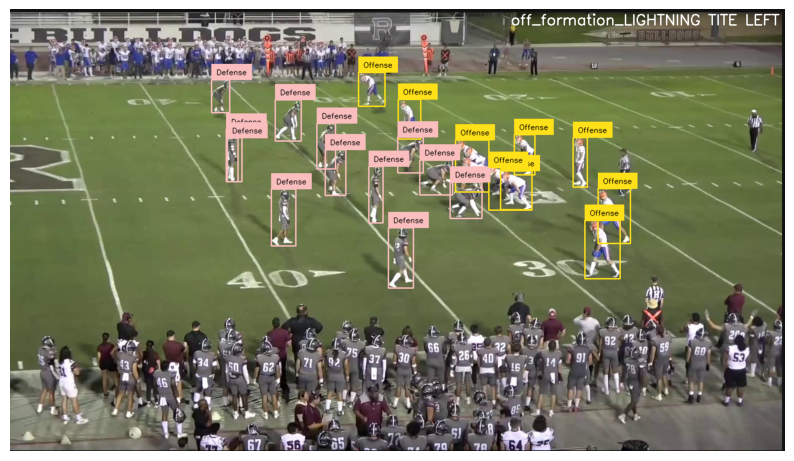

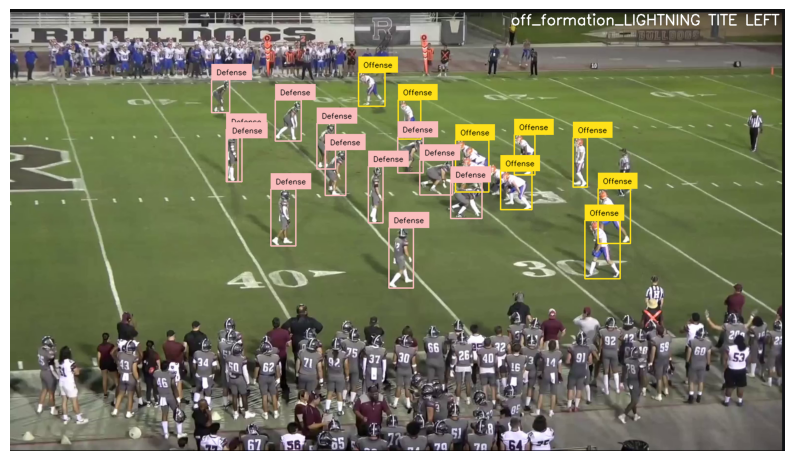

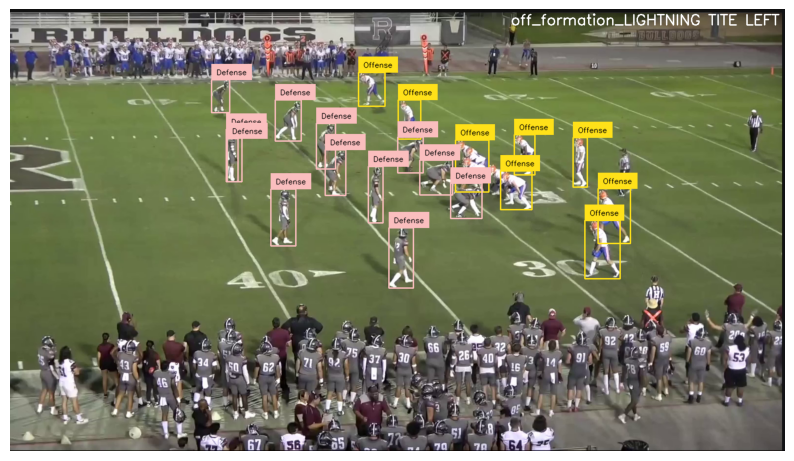

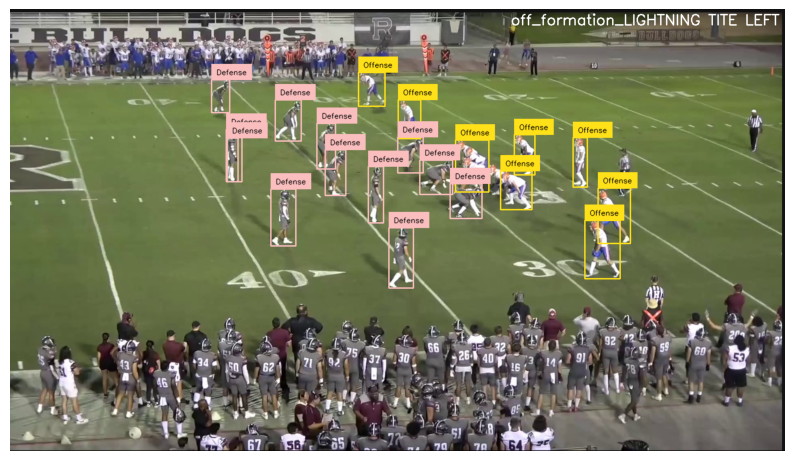

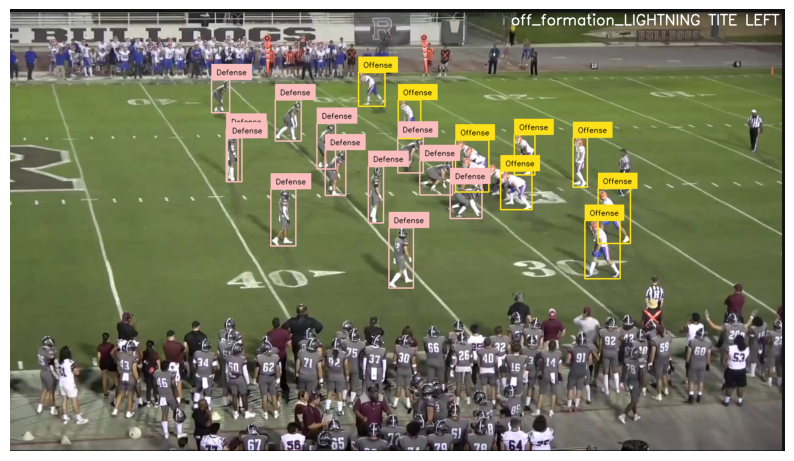

...

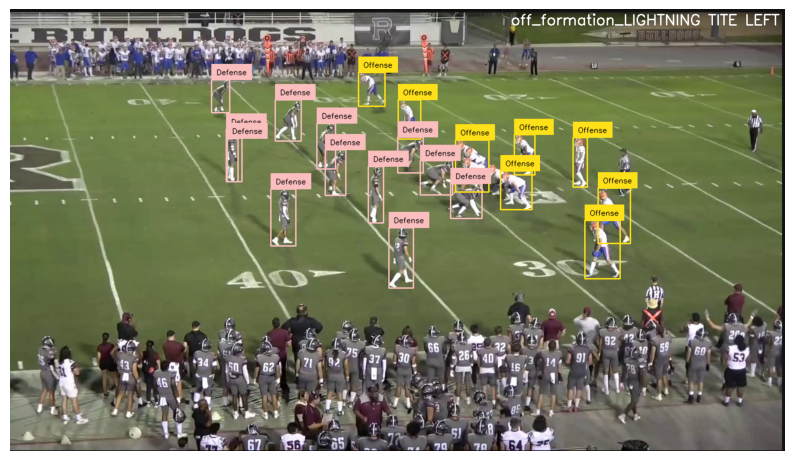

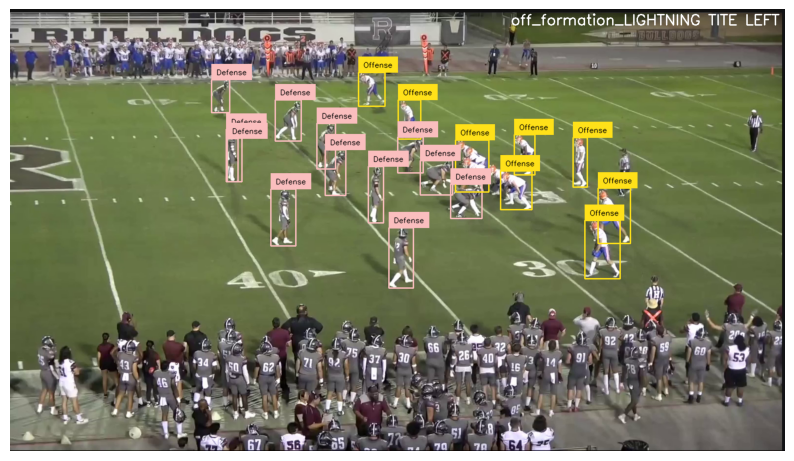

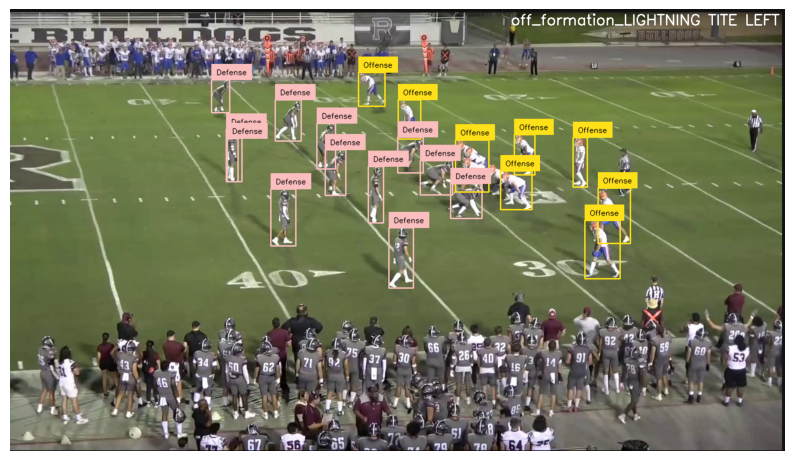

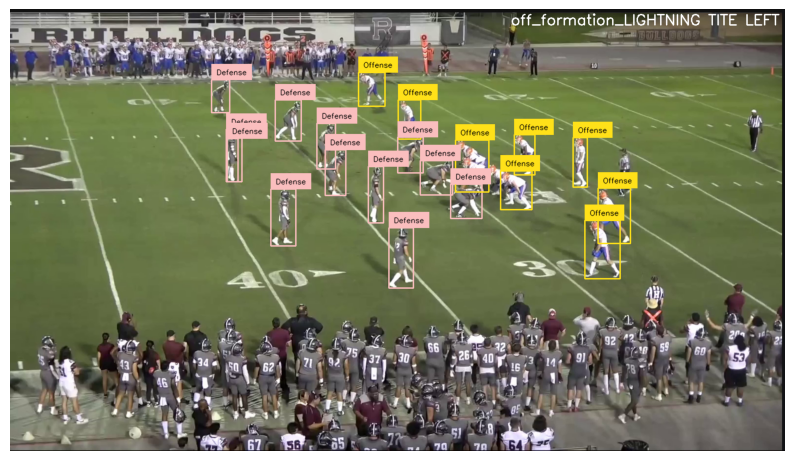

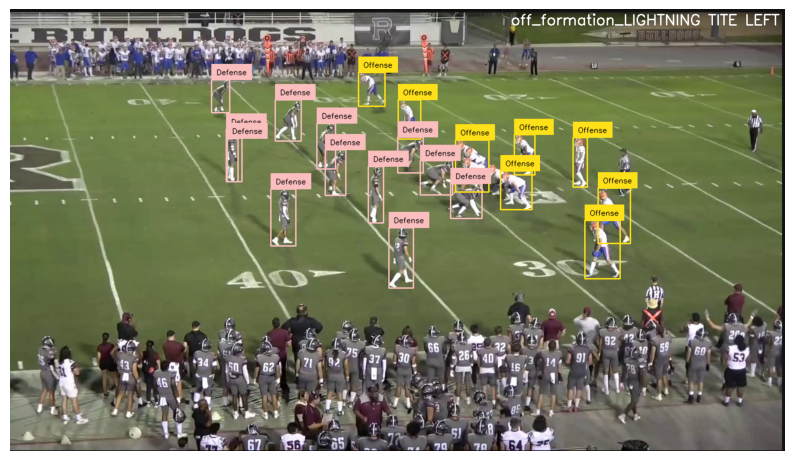

In [ ]:

def process_frame(frame: np.ndarray, _) -> np.ndarray:
    global correct, halfcorrect, total  # To global track frame counts
    # Run segmentation model
    seg_results = modelSeg(frame,imgsz=1600)[0]
    # Run detection model
    det_results = model(frame, imgsz= 1600)[0]
    #print(model(frame, imgsz= 1600))
    print(seg_results[0].masks.data.shape)
    print(frame.shape)
    height_scale = seg_results[0].masks.data.shape[1]/frame.shape[0]
    width_scale =seg_results[0].masks.data.shape[2]/frame.shape[1]
    print(f"height_scale: {height_scale}")
    print(f"width_scale: {width_scale}")

    box_annotator = sv.BoxAnnotator()
    label_annotator = sv.LabelAnnotator()
    labels = []
    # Convert detection results to a suitable format
    det_detections = sv.Detections.from_ultralytics(det_results)
    seg_detections = sv.Detections.from_ultralytics(seg_results)

      # Initialize empty arrays for filtered detections
    Filtered_xyxy = np.empty((0, 4), dtype=float)
    Filtered_confidence = np.empty((0,), dtype=float)
    Filtered_class_id = np.empty((0,), dtype=int)
    #Tracks the number for each type of detections
    defense =0
    off = 0
    unknown =0
    for detection in det_detections:
       # print(detection)
        x1, y1, x2, y2 = detection[0]
        confidence, class_id = detection[2], detection[3]
        #Makes sure the detection is a person
        if class_id == 0:
          #Checks for each segmentation mask if the player inside it
          for i in range(len(seg_results)):
            #Checks if a player is in a segmentation mask
            if  is_inside_area((x1, y1, x2, y2), seg_results[i]):
              #In offense of segment
              if seg_detections[i].class_id == 1:
                off +=1
                labels.append("Offense")
                class_id = 20
                Filtered_xyxy = np.append(Filtered_xyxy, [[x1, y1, x2, y2]], axis=0)
                Filtered_confidence = np.append(Filtered_confidence, [confidence])
                Filtered_class_id = np.append(Filtered_class_id, [class_id])
              #In Defense of segment
              elif seg_detections[i].class_id == 0:
                defense +=1
                labels.append("Defense")
                class_id = 10
                Filtered_xyxy = np.append(Filtered_xyxy, [[x1, y1, x2, y2]], axis=0)
                Filtered_confidence = np.append(Filtered_confidence, [confidence])
                Filtered_class_id = np.append(Filtered_class_id, [class_id])
              #In boundary segment
              elif seg_detections[i].class_id == 0:
                class_id = 1
                #Filtered_xyxy = np.append(Filtered_xyxy, [[x1, y1, x2, y2]], axis=0)
                #Filtered_confidence = np.append(Filtered_confidence, [confidence])
                # Filtered_class_id = np.append(Filtered_class_id, [class_id])
                # unknown +=1
    print(f"defense: {defense}")
    print(f"offense: {off}")
    print(f"unknown: {unknown}")
    if off == 11 and defense ==11:
      correct +=1
    elif off == 11 or defense ==11:
      halfcorrect +=1
    total +=1


    # Create a new Detections object with the filtered detections
    filtered_detections = Detections(
    xyxy=Filtered_xyxy,
    mask=None,
    confidence=Filtered_confidence,
    class_id=Filtered_class_id,
    tracker_id=None
)
    player_coordinates = process_image(cv2.resize(frame, (1582,902), interpolation=cv2.INTER_AREA), _)
    print(player_coordinates.shape)
    new_input_scaled = scaler.transform(player_coordinates.reshape(1, -1))

    # Reshape the data for the model, if necessary
    input_data_reshaped = new_input_scaled.reshape((1, 11, 2))
    predictions = formationModel.predict(input_data_reshaped)
    predicted_class_index = np.argmax(predictions, axis=1)
    text = y.columns[predicted_class_index][0]  # Get the corresponding class name



    # Annotate the frame
    # This assumes that box_annotator.annotate can handle a Detections object directly
    frame = box_annotator.annotate(scene=frame, detections=filtered_detections)
    frame = label_annotator.annotate(scene=frame, detections=filtered_detections, labels=labels)
   # text = "Your Text Here"
    font = cv2.FONT_HERSHEY_SIMPLEX
    font_scale = 1
    font_color = (255, 255, 255)  # White
    thickness = 2

    # Get the width and height of the text box
    text_size = cv2.getTextSize(text, font, font_scale, thickness)[0]

    # Set the text start position (top right corner)
    text_x = frame.shape[1] - text_size[0] - 10  # 10 pixels from the right edge
    text_y = text_size[1] + 10  # 10 pixels from the top

        # Add text to the frame
    cv2.putText(frame, text, (text_x, text_y), font, font_scale, font_color, thickness)

    #frame =apply_colored_mask(frame, seg_results, seg_detections, alpha=0.5)


    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

    # Plot the frame
    plt.figure(figsize=(10, 10))
    plt.imshow(frame_rgb)
    plt.axis('off')  # Turn off axis numbers
 #   plt.show()
    return frame


cap = cv2.VideoCapture(VIDEO_PATH)

# Check if opening the video was successful
if not cap.isOpened():
    raise IOError(f"Cannot open the video file {VIDEO_PATH}")

# Don't forget to release the capture when it's no longer needed
cap.release()
sv.process_video(source_path=VIDEO_PATH, target_path=f"result1.mp4", callback=process_frame)
print(f"correct: {correct}")
print(f"halfcorrect: {halfcorrect}")
print(f"wrong: {correct+ halfcorrect -total}")
print(f"total: {total}")

## Video
Runs video analysis here

In [ ]:
video_path = "/content/drive/My Drive/MidtermProject/test3.mp4"
cap = cv2.VideoCapture(video_path)


# Define the video writer
fourcc = cv2.VideoWriter_fourcc(*'MJPG')
out = cv2.VideoWriter('output.mp4', fourcc, 59.83, (int(cap.get(3)), int(cap.get(4))))

# Loop through the video frames
while cap.isOpened():
    # Read a frame from the video
    success, frame = cap.read()

    if success:
        # Run YOLOv8 inference on the frame
        results = modelSeg(frame, imgsz= 1582)
        print(results[0].orig_shape)

        print(results[0].masks.shape)
        # Visualize the results on the frame
        annotated_frame = results[0].plot()

        # Write the frame to the output video
        out.write(annotated_frame)

        # Display the annotated frame
      #  cv2.imshow("YOLOv8 Inference", annotated_frame)


    else:
        # Break the loop if the end of the video is reached
        break

# Release the video capture object, video writer and close the display window
cap.release()
out.release()


#Generating new data set of labeled detections

In [ ]:
#Take fram
def process_image(frame: np.ndarray, _) -> np.ndarray:

    # Run segmentation model
    seg_results = modelSeg(frame,imgsz=1600)[0]

    # Run detection model
    det_results = model(frame, imgsz= 1600)[0]
    print(seg_results[0].masks.data.shape)
    print(frame.shape)
    height_scale = seg_results[0].masks.data.shape[1]/frame.shape[0]
    width_scale =seg_results[0].masks.data.shape[2]/frame.shape[1]
    box_annotator = sv.BoxAnnotator(thickness=4, text_thickness=4, text_scale=2)

    # Convert detection results to a suitable format
    det_detections = sv.Detections.from_ultralytics(det_results)
    seg_detections = sv.Detections.from_ultralytics(seg_results)


    #Tracks the number for each type of detections
    offense_array = []
    defense_array = []
    defense =0
    off = 0
    for detection in det_detections:

        x1, y1, x2, y2 = detection[0]
        confidence, class_id = detection[2], detection[3]

        #Makes sure the detection is a person
        if class_id == 0:

          #Checks for each segmentation mask if the player inside it

          for i in range(len(seg_results)):

            #Checks if a player is in a segmentation mask
            if  is_inside_area((x1, y1, x2, y2), seg_results[i]):

              #In offense of segment
              if seg_detections[i].class_id == 1 :
                offense_array.append(((x1+x2)/2,y1))
                off +=1
              #In Defense of segment
              elif seg_detections[i].class_id == 0 :
               # defense_array.append(((x1+x2)/2,y1))
                defense +=1
                class_id = 10

    print(f"defense: {defense}")
    print(f"offense: {off}")

    while len(offense_array)<11:
      offense_array.append((0,0))
    while len(defense_array)<11:
      defense_array.append((0,0))

  #  res= np.array(offense_array + defense_array)
    res= np.array(offense_array)

    return res


## Concatenates  segmentation results on to new dataset

In [ ]:
#Take fram
def process_image_seg_Shape(frame: np.ndarray, _) -> np.ndarray:

    # Run segmentation model
    seg_results = modelSeg(frame,imgsz=1600)[0]


    seg_detections = sv.Detections.from_ultralytics(seg_results)

    offense_array = np.zeros_like(seg_results[0].masks.data.numpy())
    defense_array = np.zeros_like(seg_results[0].masks.data.numpy())

    for i in range(len(seg_results)):
      #Checks if a player is in a segmentation mask

      #In offense of segment
      if seg_detections[i].class_id == 1 :
        offense_array += seg_results[i].masks.data.numpy()
      #In Defense of segment
      elif seg_detections[i].class_id == 0 :
        defense_array += seg_results[i].masks.data.numpy()

              #In boundary segment
              #elif seg_detections[i].class_id == 0:
               # class_id = 1
    offense_array = np.where(offense_array != 0, 1, 0)
    defense_array = np.where(defense_array != 0, 1, 0)

  # Flatten arrays and concatenate them
    res = np.concatenate((offense_array.flatten(), defense_array.flatten()))


    return res

##Data Processing

###Sub

In [ ]:
df = pd.read_csv('/content/drive/My Drive/MidtermProject/initialData.csv')

# To display the first few rows of the DataFrame
print(df.head())


                                          image_name off_formation  \
0  3e89c81a2df8bd225c56519a9bb7a2a9a978a496b9a5a2...        B FLEX   
1  72ca2eab10e0a4da4be408b19c2aa09c617d0416cad035...        B FLEX   
2  9e60fb41d0f433bf193933a405c57f208eb35c5f18a41a...   BUNCH SPLIT   
3  c5473b3327bd3e7b686d096bca992e4889d7704f839488...        B FLEX   
4  5aa3aa4399c7db67b075104a368d2d362f8015e539f5d7...        ROCKET   

     off_play off_play_type  play_res  
0  GB COUNTER           Run      Rush  
1  CALIFORNIA           Run      Rush  
2         NaN          Pass  Scramble  
3  GB COUNTER           Run      Rush  
4         NaN          Pass  Complete  


In [ ]:
df = df.dropna(subset=['off_formation'])
base_path ='/content/drive/My Drive/MidtermProject/formationPhotos'
df = df[df['image_name'].apply(lambda x: os.path.exists(os.path.join(base_path, x)))]
print(df.head())



                                          image_name off_formation  \
0  3e89c81a2df8bd225c56519a9bb7a2a9a978a496b9a5a2...        B FLEX   
1  72ca2eab10e0a4da4be408b19c2aa09c617d0416cad035...        B FLEX   
2  9e60fb41d0f433bf193933a405c57f208eb35c5f18a41a...   BUNCH SPLIT   
3  c5473b3327bd3e7b686d096bca992e4889d7704f839488...        B FLEX   
4  5aa3aa4399c7db67b075104a368d2d362f8015e539f5d7...        ROCKET   

     off_play off_play_type  play_res  
0  GB COUNTER           Run      Rush  
1  CALIFORNIA           Run      Rush  
2         NaN          Pass  Scramble  
3  GB COUNTER           Run      Rush  
4         NaN          Pass  Complete  


In [ ]:
from PIL import Image
import numpy as np

def load_image_to_numpy(path):
    """ Load a PNG image and convert it to a NumPy array. """
    with Image.open(path) as img:
        if img.mode == 'RGBA':
            img = img.convert('RGB')
        return np.array(img)

### running


In [ ]:
for i in range(1, 12):
    df[f'offense_player{i}_x'] = np.nan
    df[f'offense_player{i}_y'] = np.nan
    df[f'defense_player{i}_x'] = np.nan
    df[f'defense_player{i}_y'] = np.nan

from PIL import Image

# Process each image and update the DataFrame
for index, row in df.iterrows():
    image_path = os.path.join(base_path, row['image_name'])
    if os.path.exists(image_path):
        frame = load_image_to_numpy(image_path)  # Load the image as a NumPy array
        frame =cv2.resize(frame, (1582,902), interpolation=cv2.INTER_AREA)

        player_coordinates = process_image(frame, _)  # Process the image

        # Update the DataFrame with the new data for offense and defense players
        for i in range(11):
            df.at[index, f'offense_player{i+1}_x'] = player_coordinates[i][0]
            df.at[index, f'offense_player{i+1}_y'] = player_coordinates[i][1]
            df.at[index, f'defense_player{i+1}_x'] = player_coordinates[11+i][0]
            df.at[index, f'defense_player{i+1}_y'] = player_coordinates[11+i][1]

# Save the updated DataFrame
df.to_csv('updated_file.csv', index=False)
# Save the updated DataFrame to a CSV file
df.to_csv('/content/drive/My Drive/MidtermProject/labeledData.csv', index=False)

<ipython-input-19-4d4a8aaaf4bb>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[f'offense_player{i}_x'] = np.nan
<ipython-input-19-4d4a8aaaf4bb>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[f'offense_player{i}_y'] = np.nan
<ipython-input-19-4d4a8aaaf4bb>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/

torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 8
offense: 9
adaf



0: 928x1600 1 defense, 1 offense, 60.6ms
Speed: 9.3ms preprocess, 60.6ms inference, 2.6ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 81 persons, 1 bird, 1 frisbee, 2 sports balls, 20.1ms
Speed: 8.7ms preprocess, 20.1ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 8
offense: 7
adaf



0: 928x1600 1 defense, 1 offense, 58.3ms
Speed: 8.5ms preprocess, 58.3ms inference, 2.5ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 70 persons, 1 bus, 1 umbrella, 1 chair, 19.4ms
Speed: 8.8ms preprocess, 19.4ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 9
offense: 5
adaf



0: 928x1600 1 defense, 1 offense, 57.1ms
Speed: 8.8ms preprocess, 57.1ms inference, 2.6ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 75 persons, 2 sports balls, 19.1ms
Speed: 9.0ms preprocess, 19.1ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 8
offense: 7
adaf



0: 928x1600 1 defense, 1 offense, 63.4ms
Speed: 8.6ms preprocess, 63.4ms inference, 3.4ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 76 persons, 1 backpack, 1 sports ball, 20.8ms
Speed: 8.1ms preprocess, 20.8ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 6
offense: 5
adaf



0: 928x1600 1 defense, 2 offenses, 57.5ms
Speed: 8.7ms preprocess, 57.5ms inference, 4.2ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 71 persons, 1 car, 1 umbrella, 1 frisbee, 2 sports balls, 1 baseball bat, 19.0ms
Speed: 9.0ms preprocess, 19.0ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 11
offense: 17
adaf



0: 928x1600 3 defenses, 1 offense, 47.9ms
Speed: 9.3ms preprocess, 47.9ms inference, 3.0ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 64 persons, 1 umbrella, 1 frisbee, 1 sports ball, 1 baseball glove, 16.3ms
Speed: 9.2ms preprocess, 16.3ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 22
offense: 7
adaf



0: 928x1600 1 defense, 2 offenses, 63.1ms
Speed: 8.9ms preprocess, 63.1ms inference, 2.8ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 47 persons, 2 dogs, 20.8ms
Speed: 8.6ms preprocess, 20.8ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 8
offense: 13
adaf



0: 928x1600 1 defense, 1 offense, 59.8ms
Speed: 9.4ms preprocess, 59.8ms inference, 2.5ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 74 persons, 20.8ms
Speed: 9.4ms preprocess, 20.8ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 10
offense: 5
adaf



0: 928x1600 1 defense, 1 offense, 59.4ms
Speed: 9.3ms preprocess, 59.4ms inference, 2.6ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 68 persons, 19.7ms
Speed: 9.1ms preprocess, 19.7ms inference, 1.7ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 9
offense: 8
adaf



0: 928x1600 1 defense, 4 offenses, 47.0ms
Speed: 8.9ms preprocess, 47.0ms inference, 2.5ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 62 persons, 2 cars, 1 umbrella, 15.9ms
Speed: 8.3ms preprocess, 15.9ms inference, 1.4ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 6
offense: 24
adaf



0: 928x1600 1 defense, 2 offenses, 63.1ms
Speed: 8.7ms preprocess, 63.1ms inference, 2.5ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 73 persons, 21.0ms
Speed: 8.8ms preprocess, 21.0ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 8
offense: 15
adaf



0: 928x1600 1 defense, 1 offense, 63.0ms
Speed: 8.9ms preprocess, 63.0ms inference, 2.3ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 76 persons, 1 umbrella, 1 handbag, 21.1ms
Speed: 8.4ms preprocess, 21.1ms inference, 3.0ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 11
offense: 5
adaf



0: 928x1600 1 defense, 1 offense, 54.3ms
Speed: 9.0ms preprocess, 54.3ms inference, 3.2ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 75 persons, 1 baseball glove, 18.2ms
Speed: 8.4ms preprocess, 18.2ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 10
offense: 8
adaf



0: 928x1600 1 defense, 1 offense, 44.1ms
Speed: 8.4ms preprocess, 44.1ms inference, 2.3ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 68 persons, 1 sports ball, 15.0ms
Speed: 8.4ms preprocess, 15.0ms inference, 1.4ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 9
offense: 6
adaf



0: 928x1600 1 defense, 1 offense, 41.4ms
Speed: 8.3ms preprocess, 41.4ms inference, 3.4ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 78 persons, 14.0ms
Speed: 8.5ms preprocess, 14.0ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 10
offense: 7
adaf



0: 928x1600 1 defense, 1 offense, 39.5ms
Speed: 8.9ms preprocess, 39.5ms inference, 2.4ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 67 persons, 14.1ms
Speed: 9.3ms preprocess, 14.1ms inference, 1.7ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 11
offense: 5
adaf



0: 928x1600 1 defense, 1 offense, 59.3ms
Speed: 8.6ms preprocess, 59.3ms inference, 2.5ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 71 persons, 1 chair, 20.0ms
Speed: 8.8ms preprocess, 20.0ms inference, 1.4ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 11
offense: 6
adaf



0: 928x1600 1 defense, 1 offense, 63.4ms
Speed: 9.8ms preprocess, 63.4ms inference, 2.9ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 80 persons, 1 umbrella, 1 frisbee, 1 baseball bat, 20.8ms
Speed: 8.8ms preprocess, 20.8ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 10
offense: 7
adaf



0: 928x1600 1 defense, 1 offense, 53.5ms
Speed: 8.6ms preprocess, 53.5ms inference, 2.6ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 89 persons, 3 frisbees, 17.9ms
Speed: 8.6ms preprocess, 17.9ms inference, 1.8ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 7
offense: 8
adaf



0: 928x1600 2 defenses, 1 offense, 44.5ms
Speed: 8.5ms preprocess, 44.5ms inference, 2.4ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 68 persons, 1 car, 1 umbrella, 1 sports ball, 1 baseball bat, 15.6ms
Speed: 8.1ms preprocess, 15.6ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 19
offense: 9
adaf



0: 928x1600 2 defenses, 1 offense, 63.2ms
Speed: 8.5ms preprocess, 63.2ms inference, 2.5ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 76 persons, 1 motorcycle, 1 kite, 1 chair, 20.8ms
Speed: 9.0ms preprocess, 20.8ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 19
offense: 9
adaf



0: 928x1600 2 defenses, 1 offense, 52.1ms
Speed: 8.7ms preprocess, 52.1ms inference, 2.6ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 66 persons, 1 motorcycle, 17.4ms
Speed: 8.7ms preprocess, 17.4ms inference, 1.4ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 17
offense: 11
adaf



0: 928x1600 1 defense, 1 offense, 63.5ms
Speed: 9.4ms preprocess, 63.5ms inference, 2.5ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 76 persons, 1 umbrella, 20.8ms
Speed: 9.3ms preprocess, 20.8ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 6
offense: 8
adaf



0: 928x1600 2 defenses, 2 offenses, 63.1ms
Speed: 9.5ms preprocess, 63.1ms inference, 2.8ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 75 persons, 1 umbrella, 20.8ms
Speed: 8.4ms preprocess, 20.8ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 16
offense: 16
adaf



0: 928x1600 2 defenses, 1 offense, 61.7ms
Speed: 9.4ms preprocess, 61.7ms inference, 2.5ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 60 persons, 1 horse, 1 umbrella, 1 frisbee, 1 sports ball, 1 baseball bat, 1 cup, 20.4ms
Speed: 8.6ms preprocess, 20.4ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 19
offense: 6
adaf



0: 928x1600 1 defense, 2 offenses, 52.0ms
Speed: 9.0ms preprocess, 52.0ms inference, 2.6ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 62 persons, 1 baseball bat, 17.4ms
Speed: 8.4ms preprocess, 17.4ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 7
offense: 8
adaf



0: 928x1600 1 defense, 1 offense, 63.1ms
Speed: 9.2ms preprocess, 63.1ms inference, 2.6ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 69 persons, 1 umbrella, 1 frisbee, 1 sports ball, 1 baseball bat, 20.8ms
Speed: 9.5ms preprocess, 20.8ms inference, 1.7ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 9
offense: 7
adaf



0: 928x1600 2 defenses, 2 offenses, 63.2ms
Speed: 8.9ms preprocess, 63.2ms inference, 2.5ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 72 persons, 3 motorcycles, 1 umbrella, 1 baseball glove, 20.8ms
Speed: 8.4ms preprocess, 20.8ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 23
offense: 14
adaf



0: 928x1600 1 defense, 1 offense, 54.4ms
Speed: 8.7ms preprocess, 54.4ms inference, 3.2ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 80 persons, 1 umbrella, 1 frisbee, 17.9ms
Speed: 8.8ms preprocess, 17.9ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 11
offense: 5
adaf



0: 928x1600 1 defense, 1 offense, 50.9ms
Speed: 9.1ms preprocess, 50.9ms inference, 2.4ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 81 persons, 1 umbrella, 17.1ms
Speed: 8.9ms preprocess, 17.1ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 9
offense: 5
adaf



0: 928x1600 1 defense, 1 offense, 43.0ms
Speed: 10.1ms preprocess, 43.0ms inference, 2.7ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 72 persons, 14.9ms
Speed: 8.6ms preprocess, 14.9ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 11
offense: 6
adaf



0: 928x1600 1 defense, 1 offense, 63.1ms
Speed: 9.2ms preprocess, 63.1ms inference, 2.5ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 65 persons, 20.8ms
Speed: 8.9ms preprocess, 20.8ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 10
offense: 5
adaf



0: 928x1600 1 defense, 1 offense, 51.0ms
Speed: 9.0ms preprocess, 51.0ms inference, 2.4ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 59 persons, 1 frisbee, 1 kite, 17.1ms
Speed: 8.6ms preprocess, 17.1ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 9
offense: 9
adaf



0: 928x1600 1 defense, 1 offense, 50.2ms
Speed: 10.0ms preprocess, 50.2ms inference, 2.7ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 72 persons, 16.9ms
Speed: 8.9ms preprocess, 16.9ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 9
offense: 7
adaf



0: 928x1600 2 defenses, 1 offense, 43.0ms
Speed: 8.4ms preprocess, 43.0ms inference, 2.5ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 83 persons, 1 umbrella, 2 baseball gloves, 14.8ms
Speed: 8.9ms preprocess, 14.8ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 19
offense: 9
adaf



0: 928x1600 2 defenses, 1 offense, 63.0ms
Speed: 9.0ms preprocess, 63.0ms inference, 2.8ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 76 persons, 20.8ms
Speed: 8.6ms preprocess, 20.8ms inference, 1.8ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 15
offense: 9
adaf



0: 928x1600 3 defenses, 1 offense, 52.7ms
Speed: 8.2ms preprocess, 52.7ms inference, 2.5ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 63 persons, 1 baseball glove, 17.6ms
Speed: 8.9ms preprocess, 17.6ms inference, 1.4ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 25
offense: 8
adaf



0: 928x1600 2 defenses, 2 offenses, 49.1ms
Speed: 8.6ms preprocess, 49.1ms inference, 2.6ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 73 persons, 2 chairs, 16.5ms
Speed: 8.8ms preprocess, 16.5ms inference, 1.7ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 18
offense: 12
adaf



0: 928x1600 1 defense, 1 offense, 63.6ms
Speed: 8.8ms preprocess, 63.6ms inference, 2.8ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 72 persons, 20.8ms
Speed: 8.9ms preprocess, 20.8ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 11
offense: 8
adaf



0: 928x1600 1 defense, 1 offense, 58.2ms
Speed: 8.2ms preprocess, 58.2ms inference, 2.4ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 71 persons, 19.4ms
Speed: 9.0ms preprocess, 19.4ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 10
offense: 5
adaf



0: 928x1600 1 defense, 1 offense, 49.7ms
Speed: 8.7ms preprocess, 49.7ms inference, 2.5ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 79 persons, 1 baseball glove, 1 chair, 16.7ms
Speed: 8.4ms preprocess, 16.7ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 9
offense: 8
adaf



0: 928x1600 2 defenses, 1 offense, 43.7ms
Speed: 8.5ms preprocess, 43.7ms inference, 2.3ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 46 persons, 1 frisbee, 1 baseball bat, 1 baseball glove, 14.9ms
Speed: 8.6ms preprocess, 14.9ms inference, 1.4ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 11
offense: 7
adaf



0: 928x1600 2 defenses, 1 offense, 63.0ms
Speed: 9.6ms preprocess, 63.0ms inference, 2.6ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 81 persons, 1 horse, 1 umbrella, 2 frisbees, 20.8ms
Speed: 9.2ms preprocess, 20.8ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 13
offense: 5
adaf



0: 928x1600 2 defenses, 1 offense, 50.3ms
Speed: 8.9ms preprocess, 50.3ms inference, 2.5ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 70 persons, 16.9ms
Speed: 8.6ms preprocess, 16.9ms inference, 1.4ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 20
offense: 13
adaf



0: 928x1600 1 defense, 1 offense, 63.0ms
Speed: 9.4ms preprocess, 63.0ms inference, 2.6ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 76 persons, 20.9ms
Speed: 8.7ms preprocess, 20.9ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 9
offense: 6
adaf



0: 928x1600 2 defenses, 1 offense, 48.3ms
Speed: 9.1ms preprocess, 48.3ms inference, 2.6ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 65 persons, 16.3ms
Speed: 8.5ms preprocess, 16.3ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 16
offense: 7
adaf



0: 928x1600 2 defenses, 2 offenses, 63.0ms
Speed: 9.1ms preprocess, 63.0ms inference, 2.6ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 76 persons, 20.8ms
Speed: 8.6ms preprocess, 20.8ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 18
offense: 10
adaf



0: 928x1600 1 defense, 1 offense, 54.3ms
Speed: 8.8ms preprocess, 54.3ms inference, 2.3ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 80 persons, 1 motorcycle, 1 traffic light, 18.1ms
Speed: 7.7ms preprocess, 18.1ms inference, 1.4ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 8
offense: 6
adaf



0: 928x1600 1 defense, 1 offense, 46.1ms
Speed: 9.4ms preprocess, 46.1ms inference, 4.6ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 73 persons, 1 fire hydrant, 15.6ms
Speed: 8.9ms preprocess, 15.6ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 7
offense: 6
adaf



0: 928x1600 1 defense, 1 offense, 63.3ms
Speed: 9.7ms preprocess, 63.3ms inference, 2.6ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 75 persons, 1 bench, 1 chair, 20.8ms
Speed: 8.7ms preprocess, 20.8ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 10
offense: 5
adaf



0: 928x1600 1 defense, 1 offense, 51.1ms
Speed: 19.0ms preprocess, 51.1ms inference, 4.1ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 60 persons, 18.1ms
Speed: 10.6ms preprocess, 18.1ms inference, 2.8ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 7
offense: 6
adaf



0: 928x1600 1 defense, 2 offenses, 63.1ms
Speed: 9.2ms preprocess, 63.1ms inference, 2.8ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 71 persons, 2 umbrellas, 20.8ms
Speed: 8.5ms preprocess, 20.8ms inference, 1.7ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 10
offense: 13
adaf



0: 928x1600 3 defenses, 1 offense, 53.7ms
Speed: 8.6ms preprocess, 53.7ms inference, 2.7ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 75 persons, 1 umbrella, 1 baseball bat, 18.0ms
Speed: 11.8ms preprocess, 18.0ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 25
offense: 6
adaf



0: 928x1600 1 defense, 1 offense, 63.1ms
Speed: 8.7ms preprocess, 63.1ms inference, 2.3ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 81 persons, 1 train, 1 umbrella, 6 sports balls, 20.8ms
Speed: 8.6ms preprocess, 20.8ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 11
offense: 6
adaf



0: 928x1600 1 defense, 1 offense, 56.8ms
Speed: 9.0ms preprocess, 56.8ms inference, 3.6ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 82 persons, 1 umbrella, 1 frisbee, 7 sports balls, 1 baseball bat, 1 baseball glove, 18.7ms
Speed: 8.9ms preprocess, 18.7ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 8
offense: 6
adaf



0: 928x1600 1 defense, 1 offense, 48.1ms
Speed: 8.6ms preprocess, 48.1ms inference, 2.6ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 74 persons, 1 frisbee, 2 sports balls, 16.3ms
Speed: 8.6ms preprocess, 16.3ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 11
offense: 6
adaf



0: 928x1600 1 defense, 1 offense, 43.7ms
Speed: 8.4ms preprocess, 43.7ms inference, 2.6ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 54 persons, 2 horses, 14.8ms
Speed: 8.8ms preprocess, 14.8ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 11
offense: 7
adaf



0: 928x1600 1 defense, 1 offense, 63.5ms
Speed: 9.3ms preprocess, 63.5ms inference, 3.7ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 58 persons, 2 horses, 1 sports ball, 20.8ms
Speed: 9.3ms preprocess, 20.8ms inference, 1.7ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 10
offense: 7
adaf



0: 928x1600 1 defense, 1 offense, 59.6ms
Speed: 9.8ms preprocess, 59.6ms inference, 2.5ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 68 persons, 3 sports balls, 19.8ms
Speed: 8.9ms preprocess, 19.8ms inference, 1.8ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 10
offense: 8
adaf



0: 928x1600 1 defense, 1 offense, 46.3ms
Speed: 9.1ms preprocess, 46.3ms inference, 2.6ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 70 persons, 1 motorcycle, 1 sports ball, 15.7ms
Speed: 8.8ms preprocess, 15.7ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 10
offense: 7
adaf



0: 928x1600 1 defense, 1 offense, 63.1ms
Speed: 8.8ms preprocess, 63.1ms inference, 2.7ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 60 persons, 1 motorcycle, 6 sports balls, 20.8ms
Speed: 8.8ms preprocess, 20.8ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 7
offense: 4
adaf



0: 928x1600 1 defense, 1 offense, 56.6ms
Speed: 9.1ms preprocess, 56.6ms inference, 2.7ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 62 persons, 1 dog, 1 horse, 1 cow, 2 sports balls, 1 baseball glove, 19.2ms
Speed: 9.1ms preprocess, 19.2ms inference, 1.9ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 11
offense: 10
adaf



0: 928x1600 1 defense, 1 offense, 63.1ms
Speed: 8.8ms preprocess, 63.1ms inference, 2.6ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 68 persons, 1 sports ball, 20.8ms
Speed: 9.4ms preprocess, 20.8ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 11
offense: 9
adaf



0: 928x1600 1 defense, 1 offense, 61.9ms
Speed: 9.2ms preprocess, 61.9ms inference, 2.5ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 67 persons, 2 sports balls, 20.4ms
Speed: 9.2ms preprocess, 20.4ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 14
offense: 10
adaf



0: 928x1600 1 defense, 2 offenses, 63.3ms
Speed: 9.3ms preprocess, 63.3ms inference, 2.6ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 49 persons, 20.8ms
Speed: 8.4ms preprocess, 20.8ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 10
offense: 16
adaf



0: 928x1600 1 defense, 2 offenses, 48.8ms
Speed: 9.1ms preprocess, 48.8ms inference, 2.6ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 48 persons, 16.5ms
Speed: 9.0ms preprocess, 16.5ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 11
offense: 18
adaf



0: 928x1600 1 defense, 1 offense, 63.0ms
Speed: 9.2ms preprocess, 63.0ms inference, 2.3ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 59 persons, 3 sports balls, 21.2ms
Speed: 8.1ms preprocess, 21.2ms inference, 3.1ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 10
offense: 10
adaf



0: 928x1600 1 defense, 1 offense, 58.8ms
Speed: 8.8ms preprocess, 58.8ms inference, 2.6ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 52 persons, 1 motorcycle, 2 dogs, 3 horses, 1 sports ball, 19.4ms
Speed: 9.0ms preprocess, 19.4ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 8
offense: 3
adaf



0: 928x1600 1 defense, 1 offense, 55.4ms
Speed: 10.2ms preprocess, 55.4ms inference, 2.5ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 44 persons, 1 airplane, 1 dog, 1 sports ball, 18.4ms
Speed: 8.7ms preprocess, 18.4ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 10
offense: 5
adaf



0: 928x1600 1 defense, 1 offense, 63.4ms
Speed: 9.1ms preprocess, 63.4ms inference, 2.6ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 63 persons, 6 sports balls, 1 baseball glove, 21.0ms
Speed: 8.6ms preprocess, 21.0ms inference, 1.7ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 10
offense: 8
adaf



0: 928x1600 1 defense, 1 offense, 63.1ms
Speed: 9.7ms preprocess, 63.1ms inference, 2.5ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 56 persons, 1 airplane, 2 sports balls, 20.9ms
Speed: 9.5ms preprocess, 20.9ms inference, 1.7ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 11
offense: 9
adaf



0: 928x1600 1 defense, 1 offense, 53.8ms
Speed: 8.7ms preprocess, 53.8ms inference, 2.6ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 66 persons, 6 sports balls, 18.0ms
Speed: 10.1ms preprocess, 18.0ms inference, 1.7ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 11
offense: 9
adaf



0: 928x1600 1 defense, 1 offense, 63.3ms
Speed: 9.2ms preprocess, 63.3ms inference, 2.6ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 70 persons, 1 dog, 1 horse, 4 sports balls, 21.0ms
Speed: 8.8ms preprocess, 21.0ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 11
offense: 10
adaf



0: 928x1600 1 defense, 1 offense, 50.2ms
Speed: 10.3ms preprocess, 50.2ms inference, 2.6ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 49 persons, 1 dog, 2 sports balls, 17.0ms
Speed: 10.3ms preprocess, 17.0ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 12
offense: 6
adaf



0: 928x1600 2 defenses, 1 offense, 63.1ms
Speed: 9.5ms preprocess, 63.1ms inference, 2.8ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 41 persons, 2 dogs, 1 horse, 8 sports balls, 1 baseball bat, 20.8ms
Speed: 9.0ms preprocess, 20.8ms inference, 1.7ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 11
offense: 6
adaf



0: 928x1600 1 defense, 1 offense, 50.3ms
Speed: 8.7ms preprocess, 50.3ms inference, 2.5ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 56 persons, 2 motorcycles, 1 dog, 4 sports balls, 17.0ms
Speed: 9.8ms preprocess, 17.0ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 8
offense: 5
adaf



0: 928x1600 1 defense, 1 offense, 63.2ms
Speed: 9.7ms preprocess, 63.2ms inference, 2.5ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 53 persons, 1 sports ball, 20.8ms
Speed: 8.4ms preprocess, 20.8ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 11
offense: 10
adaf



0: 928x1600 1 defense, 1 offense, 55.2ms
Speed: 9.3ms preprocess, 55.2ms inference, 2.5ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 49 persons, 1 backpack, 1 sports ball, 18.4ms
Speed: 9.4ms preprocess, 18.4ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 13
offense: 8
adaf



0: 928x1600 1 defense, 1 offense, 50.5ms
Speed: 9.5ms preprocess, 50.5ms inference, 2.4ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 52 persons, 1 backpack, 5 sports balls, 16.9ms
Speed: 9.4ms preprocess, 16.9ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 11
offense: 7
adaf



0: 928x1600 1 defense, 1 offense, 63.3ms
Speed: 8.8ms preprocess, 63.3ms inference, 2.6ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 48 persons, 1 frisbee, 1 sports ball, 1 baseball glove, 20.8ms
Speed: 9.0ms preprocess, 20.8ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 9
offense: 8
adaf



0: 928x1600 1 defense, 1 offense, 58.2ms
Speed: 9.3ms preprocess, 58.2ms inference, 2.4ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 49 persons, 3 horses, 19.3ms
Speed: 8.8ms preprocess, 19.3ms inference, 1.4ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 6
offense: 7
adaf



0: 928x1600 1 defense, 1 offense, 63.1ms
Speed: 9.2ms preprocess, 63.1ms inference, 2.5ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 58 persons, 1 horse, 1 sports ball, 1 chair, 20.8ms
Speed: 9.3ms preprocess, 20.8ms inference, 1.7ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 10
offense: 10
adaf



0: 928x1600 1 defense, 2 offenses, 60.7ms
Speed: 9.8ms preprocess, 60.7ms inference, 2.8ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 54 persons, 1 dog, 9 horses, 20.1ms
Speed: 8.3ms preprocess, 20.1ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 13
offense: 16
adaf



0: 928x1600 1 defense, 1 offense, 57.6ms
Speed: 8.8ms preprocess, 57.6ms inference, 2.9ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 53 persons, 1 horse, 1 baseball glove, 19.1ms
Speed: 8.9ms preprocess, 19.1ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 9
offense: 8
adaf



0: 928x1600 3 defenses, 2 offenses, 51.7ms
Speed: 8.8ms preprocess, 51.7ms inference, 2.6ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 57 persons, 1 motorcycle, 1 dog, 1 horse, 17.4ms
Speed: 8.6ms preprocess, 17.4ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 20
offense: 18
adaf



0: 928x1600 1 defense, 2 offenses, 63.3ms
Speed: 9.4ms preprocess, 63.3ms inference, 2.7ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 49 persons, 8 horses, 21.0ms
Speed: 8.7ms preprocess, 21.0ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 9
offense: 4
adaf



0: 928x1600 3 defenses, 2 offenses, 57.3ms
Speed: 9.0ms preprocess, 57.3ms inference, 2.6ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 61 persons, 6 horses, 19.0ms
Speed: 8.3ms preprocess, 19.0ms inference, 1.5ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 23
offense: 9
adaf



0: 928x1600 2 defenses, 2 offenses, 52.5ms
Speed: 9.7ms preprocess, 52.5ms inference, 2.7ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 60 persons, 4 horses, 17.6ms
Speed: 9.4ms preprocess, 17.6ms inference, 1.7ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 14
offense: 12
adaf



0: 928x1600 1 defense, 1 offense, 44.4ms
Speed: 8.7ms preprocess, 44.4ms inference, 2.2ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 39 persons, 1 dog, 2 sports balls, 15.0ms
Speed: 8.9ms preprocess, 15.0ms inference, 1.3ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 11
offense: 7
adaf



0: 928x1600 2 defenses, 1 offense, 43.1ms
Speed: 9.1ms preprocess, 43.1ms inference, 2.4ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 43 persons, 1 horse, 1 sports ball, 14.8ms
Speed: 8.5ms preprocess, 14.8ms inference, 1.4ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 21
offense: 7
adaf



0: 928x1600 1 defense, 1 offense, 63.3ms
Speed: 8.7ms preprocess, 63.3ms inference, 2.6ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 49 persons, 1 dog, 1 horse, 2 sports balls, 1 chair, 20.9ms
Speed: 11.7ms preprocess, 20.9ms inference, 1.7ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 10
offense: 5
adaf



0: 928x1600 1 defense, 2 offenses, 55.4ms
Speed: 9.1ms preprocess, 55.4ms inference, 2.6ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 64 persons, 1 horse, 5 sports balls, 18.5ms
Speed: 10.0ms preprocess, 18.5ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 9
offense: 15
adaf



0: 928x1600 1 defense, 1 offense, 63.0ms
Speed: 8.6ms preprocess, 63.0ms inference, 2.7ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 70 persons, 2 dogs, 1 frisbee, 6 sports balls, 1 baseball glove, 1 skateboard, 20.9ms
Speed: 11.5ms preprocess, 20.9ms inference, 1.7ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 10
offense: 4
adaf



0: 928x1600 1 defense, 1 offense, 53.7ms
Speed: 11.6ms preprocess, 53.7ms inference, 2.5ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 72 persons, 2 dogs, 6 sports balls, 18.0ms
Speed: 8.8ms preprocess, 18.0ms inference, 1.6ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)
defense: 8
offense: 6
adaf



0: 928x1600 1 defense, 1 offense, 63.0ms
Speed: 8.7ms preprocess, 63.0ms inference, 2.9ms postprocess per image at shape (1, 3, 928, 1600)

0: 928x1600 66 persons, 2 dogs, 3 sports balls, 1 baseball glove, 20.9ms
Speed: 9.8ms preprocess, 20.9ms inference, 2.3ms postprocess per image at shape (1, 3, 928, 1600)


torch.Size([1, 928, 1600])
(902, 1582, 3)


KeyboardInterrupt: ignored

In [ ]:
new_data = []

for index, row in df.iterrows():
    image_path = os.path.join(base_path, row['image_name'])
    if os.path.exists(image_path):
        frame = load_image_to_numpy(image_path)  # Load the image as a NumPy array
        formationShape = process_image_seg_Shape(frame, _)  # Process the image

        new_data.append(formationShape)

# Convert list to DataFrame
new_df = pd.DataFrame(new_data)

# Assuming the new DataFrame columns need to be named as 'formationShape_i'
new_df.columns = [f'formationShape_{i}' for i in range(new_df.shape[1])]

# Concatenate with the original DataFrame
df = pd.concat([df, new_df], axis=1)
# Save the updated DataFrame
df.to_csv('updated_file.csv', index=False)
# Save the updated DataFrame to a CSV file
df.to_csv('/content/drive/My Drive/MidtermProject/labeledData.csv', index=False)
